In [1]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm import tqdm
from datetime import datetime
import argparse

device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
local_rank = 0
print("device:",device)

import utils
seed=42
utils.seed_everything(seed=seed)

if utils.is_interactive():
    %load_ext autoreload
    %autoreload 2

# from models import Clipper
# clip_extractor = Clipper("ViT-L/14", hidden_state=False, norm_embs=True, device=device)
imsize = 512

device: cuda:2


In [3]:
import os
from PIL import Image
import torch
import numpy as np

# Define the source and target directories
source_dir = '/home/caoxuhao1/EEG_Image_decode-main/Generation/Generation/generated_imgs/sub-10'
target_dir = '/home/caoxuhao1/EEG_Image_decode-main/Generation/Generation/generated_imgs_tensor'

# Create the target directory if it doesn't exist
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

# Initialize a list to hold all the image tensors
tensor_list = []
# Initialize a dictionary to map image file names to their categories
image_categories = {}

# Initialize the set to store unique category names
category_set = set()

# Iterate over the folders in the source directory
for folder_name in sorted(os.listdir(source_dir)):
    folder_path = os.path.join(source_dir, folder_name)

    # Extract the category name from the folder name (assuming category is part of folder_name)
    category_name = folder_name.split(' ')[-1]  # This splits the folder_name and takes the last part as the category
    category_set.add(category_name)  # Add the category name to the set

    # Check if it's a directory
    if os.path.isdir(folder_path):
        # Sort the image files to ensure consistent order
        image_files = sorted(os.listdir(folder_path))
        # Iterate over the sorted images in the folder
        for image_name in image_files:
            image_path = os.path.join(folder_path, image_name)

            # Map the image name to its category
            image_categories[image_name] = category_name

            # Load the image
            with Image.open(image_path) as img:
                # Convert the image to a PyTorch tensor and add a batch dimension
                tensor = torch.tensor(np.array(img)).unsqueeze(0)
                tensor_list.append(tensor)

# Concatenate all tensors along the 0th dimension
all_tensors = torch.cat(tensor_list, dim=0)

# Save the combined tensor
combined_tensor_path = os.path.join(target_dir, "all_images.pt")
torch.save(all_tensors, combined_tensor_path)

# Now we sort the category names and write them to a file
# along with their associated image names
categories_path = os.path.join(target_dir, "categories.txt")
with open(categories_path, 'w') as f:
    for image_name, category_name in sorted(image_categories.items()):
        f.write(f"{image_name}: {category_name}\n")

# Print out the category list, now sorted
category_list = sorted(list(category_set))
print(category_list)

['aircraft_carrier', 'antelope', 'backscratcher', 'balance_beam', 'banana', 'baseball_bat', 'basil', 'basketball', 'bassoon', 'baton4', 'batter', 'beaver', 'bench', 'bike', 'birthday_cake', 'blowtorch', 'boat', 'bok_choy', 'bonnet', 'bottle_opener', 'brace', 'bread', 'breadbox', 'bug', 'buggy', 'bullet', 'bun', 'bush', 'calamari', 'candlestick', 'cart', 'cashew', 'cat', 'caterpillar', 'cd_player', 'chain', 'chaps', 'cheese', 'cheetah', 'chest2', 'chime', 'chopsticks', 'cleat', 'cleaver', 'coat', 'cobra', 'coconut', 'coffee_bean', 'coffeemaker', 'cookie', 'cordon_bleu', 'coverall', 'crab', 'creme_brulee', 'crepe', 'crib', 'croissant', 'crow', 'cruise_ship', 'crumb', 'cupcake', 'dagger', 'dalmatian', 'dessert', 'dragonfly', 'dreidel', 'drum', 'duffel_bag', 'eagle', 'eel', 'egg', 'elephant', 'espresso', 'face_mask', 'ferry', 'flamingo', 'folder', 'fork', 'freezer', 'french_horn', 'fruit', 'garlic', 'glove', 'golf_cart', 'gondola', 'goose', 'gopher', 'gorilla', 'grasshopper', 'grenade', 'h

In [4]:
import os
from PIL import Image
import torch
import numpy as np

# Define the source and target directories
source_dir = '../../../THINGS-EEG/THINGS-EEG_images_set/test_images'
target_dir = '../../../THINGS-EEG/THINGS-EEG_images_set/test_images_tensor'
# Create the target directory if it doesn't exist
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

# Initialize a list to hold all the image tensors
tensor_list = []
# Initialize a dictionary to map image file names to their categories
image_categories = {}

# Initialize the set to store unique category names
category_set = set()

# Iterate over the folders in the source directory
for folder_name in sorted(os.listdir(source_dir)):
    folder_path = os.path.join(source_dir, folder_name)

    # Extract the category name from the folder name (assuming category is part of folder_name)
    category_name = '_'.join(folder_name.split('_')[1:])  # This splits the folder_name and takes the last part as the category
    category_set.add(category_name)  # Add the category name to the set

    # Check if it's a directory
    if os.path.isdir(folder_path):
        # Sort the image files to ensure consistent order
        image_files = sorted(os.listdir(folder_path))
        # Iterate over the sorted images in the folder
        for image_name in image_files:
            image_path = os.path.join(folder_path, image_name)

            # Map the image name to its category
            image_categories[image_name] = category_name

            # Load the image
            with Image.open(image_path) as img:
                # Convert the image to a PyTorch tensor and add a batch dimension
                tensor = torch.tensor(np.array(img)).unsqueeze(0)
                tensor_list.append(tensor)

# Concatenate all tensors along the 0th dimension
all_tensors = torch.cat(tensor_list, dim=0)

# Save the combined tensor
combined_tensor_path = os.path.join(target_dir, "all_images.pt")
torch.save(all_tensors, combined_tensor_path)

# Now we sort the category names and write them to a file
# along with their associated image names
categories_path = os.path.join(target_dir, "categories.txt")
with open(categories_path, 'w') as f:
    for image_name, category_name in sorted(image_categories.items()):
        f.write(f"{image_name}: {category_name}\n")

# Print out the category list, now sorted
category_list = sorted(list(category_set))
print(category_list)

['aircraft_carrier', 'antelope', 'backscratcher', 'balance_beam', 'banana', 'baseball_bat', 'basil', 'basketball', 'bassoon', 'baton4', 'batter', 'beaver', 'bench', 'bike', 'birthday_cake', 'blowtorch', 'boat', 'bok_choy', 'bonnet', 'bottle_opener', 'brace', 'bread', 'breadbox', 'bug', 'buggy', 'bullet', 'bun', 'bush', 'calamari', 'candlestick', 'cart', 'cashew', 'cat', 'caterpillar', 'cd_player', 'chain', 'chaps', 'cheese', 'cheetah', 'chest2', 'chime', 'chopsticks', 'cleat', 'cleaver', 'coat', 'cobra', 'coconut', 'coffee_bean', 'coffeemaker', 'cookie', 'cordon_bleu', 'coverall', 'crab', 'creme_brulee', 'crepe', 'crib', 'croissant', 'crow', 'cruise_ship', 'crumb', 'cupcake', 'dagger', 'dalmatian', 'dessert', 'dragonfly', 'dreidel', 'drum', 'duffel_bag', 'eagle', 'eel', 'egg', 'elephant', 'espresso', 'face_mask', 'ferry', 'flamingo', 'folder', 'fork', 'freezer', 'french_horn', 'fruit', 'garlic', 'glove', 'golf_cart', 'gondola', 'goose', 'gopher', 'gorilla', 'grasshopper', 'grenade', 'h

# Configurations

In [6]:
recon_path = '/home/caoxuhao1/EEG_Image_decode-main/Generation/Generation/generated_imgs_tensor/all_images.pt'
all_images_path = '/home/caoxuhao1/EEG_Image_decode-main/THINGS-EEG/THINGS-EEG_images_set/test_images_tensor/all_images.pt'
all_brain_recons = torch.load(f'{recon_path}')
all_images = torch.load(f'{all_images_path}')
all_brain_recons = all_brain_recons[::1]


all_images = all_images.to(device)

all_images = all_images.transpose(1, 3)
all_images = all_images.transpose(2, 3)
all_brain_recons = all_brain_recons.transpose(1, 3)
all_brain_recons = all_brain_recons.transpose(2, 3)
print(all_images.shape)
print(all_brain_recons.shape)

all_images = all_images.to(device)
all_brain_recons = all_brain_recons.to(device)

/tmp/ipykernel_1049489/1414589860.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  all_brain_recons = torch.load(f'{recon_path}')
/tmp/ipykernel_1049489/1414589860.py:4: 

torch.Size([200, 3, 500, 500])
torch.Size([200, 3, 512, 512])


In [7]:
print("Minimum:", all_brain_recons.min().item())
print("Maximum:", all_brain_recons.max().item())
print("Mean:", all_brain_recons.to(dtype=torch.float32).mean().item())

Minimum: 0
Maximum: 255
Mean: 135.944091796875


# Display reconstructions next to ground truth images

In [8]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import numpy as np

# Assuming all_interleaved is a tensor with shape [N, C, H, W]
# where N is the number of images, C is the number of channels,
# H is the height, and W is the width of the images.

# Function to show a single image from all_interleaved
def show_single_image(img_tensor, figsize=(5, 5)):
    img_tensor = img_tensor.detach()
    # Convert the tensor to PIL image
    img = transforms.ToPILImage()(img_tensor/255.0)
    # print(img)
    # Plotting
    plt.figure(figsize=figsize)
    plt.imshow(np.asarray(img))
    plt.axis('off')  # Hide the axis
    plt.show()

# Show the first image from all_interleaved
# show_single_image(all_interleaved[0, :, :, :])

[199 198 197 196 195 194 193 192 191 190 189 188 187 186 185 184 183 182
 181 180 179 178 177 176 175 174 173 172 171 170 169 168 167 166 165 164
 163 162 161 160 159 158 157 156 155 154 153 152 151 150 149 148 147 146
 145 144 143 142 141 140 139 138 137 136 135 134 133 132 131 130 129 128
 127 126 125 124 123 122 121 120 119 118 117 116 115 114 113 112 111 110
 109 108 107 106 105 104 103 102 101 100  99  98  97  96  95  94  93  92
  91  90  89  88  87  86  85  84  83  82  81  80  79  78  77  76  75  74
  73  72  71  70  69  68  67  66  65  64  63  62  61  60  59  58  57  56
  55  54  53  52  51  50  49  48  47  46  45  44  43  42  41  40  39  38
  37  36  35  34  33  32  31  30  29  28  27  26  25  24  23  22  21  20
  19  18  17  16  15  14  13  12  11  10   9   8   7   6   5   4   3   2
   1   0]
all_interleaved tensor([[[172., 171., 172.,  ..., 214., 213., 213.],
         [169., 168., 169.,  ..., 204., 203., 203.],
         [160., 158., 159.,  ..., 203., 202., 202.],
         ...

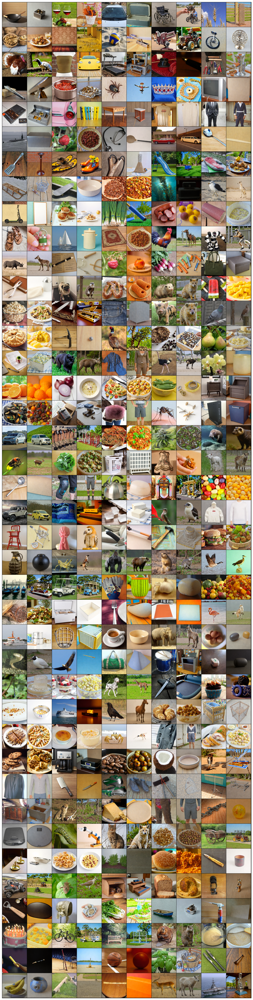

In [9]:
imsize = 256
all_images = transforms.Resize((imsize,imsize))(all_images)
all_brain_recons = transforms.Resize((imsize,imsize))(all_brain_recons)
# np.random.seed(0)
ind = np.flip(np.array([i for i in range(200)]))
print(ind)

all_interleaved = torch.zeros(len(ind)*2,3,imsize,imsize).to(device)

icount = 0
for t in ind:
    all_interleaved[icount] = all_images[t].float().to(device)
    print("all_interleaved", all_interleaved[0])
    all_interleaved[icount+1] = all_brain_recons[t].float().to(device)
    icount += 2



plt.rcParams["savefig.bbox"] = 'tight'
def show(imgs,figsize):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=figsize)
    for i, img in enumerate(imgs):
        print(i)
        img = img.detach()
        img = transforms.ToPILImage()(img/255.0)
        print(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        plt.show()
    
grid = make_grid(all_interleaved, nrow=10, padding=2)
# print(grid)
show(grid,figsize=(64,64))

# 2-Way Identification

In [10]:
from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names

@torch.no_grad()
def two_way_identification(all_brain_recons, all_images, model, preprocess, feature_layer=None, return_avg=True):
    preds = model(torch.stack([preprocess(recon) for recon in all_brain_recons], dim=0).to(device))
    reals = model(torch.stack([preprocess(indiv) for indiv in all_images], dim=0).to(device))
    if feature_layer is None:
        preds = preds.float().flatten(1).cpu().numpy()
        reals = reals.float().flatten(1).cpu().numpy()
    else:
        preds = preds[feature_layer].float().flatten(1).cpu().numpy()
        reals = reals[feature_layer].float().flatten(1).cpu().numpy()

    r = np.corrcoef(reals, preds)
    r = r[:len(all_images), len(all_images):]
    congruents = np.diag(r)

    success = r < congruents
    # 计算每行 True 值的百分比
    true_percentages = np.sum(success, axis=1) / success.shape[1] * 100

    # 按百分比排序
    sorted_indices = np.argsort(true_percentages)[::-1]
    sorted_percentages = true_percentages[sorted_indices]
    sorted_names = [category_list[i] for i in sorted_indices]

    # 打印结果
    for i in range(len(sorted_names)):
        print(f"{sorted_names[i]}: {sorted_percentages[i]:.2f}%")
    # # 绘制折线图
    # plt.figure(figsize=(20, 6))
    # plt.plot(range(1,len(category_list)+1), true_percentages, marker='o')
    # plt.title('True Percentages by Names')
    # plt.xlabel('Names')
    # plt.ylabel('True Percentages (%)')
    # plt.xticks(rotation=90)
    # plt.grid(True)
    # plt.tight_layout()  # 自动调整布局
    # plt.show()
    # success_cnt = np.sum(success, 0)
    success_cnt = np.sum(success, 1)
    if return_avg:
        perf = np.mean(success_cnt) / (len(all_images)-1)
        return perf, true_percentages
    else:
        return success_cnt, len(all_images)-1

## PixCorr

In [11]:
preprocess = transforms.Compose([
    transforms.Resize((425, 425),interpolation=transforms.InterpolationMode.BILINEAR),
])

# Flatten images while keeping the batch dimension
all_images_flattened = preprocess(all_images).reshape(len(all_images), -1).cpu()
all_brain_recons_flattened = preprocess(all_brain_recons).reshape(len(all_brain_recons), -1).cpu()

print(all_images_flattened.shape)
print(all_brain_recons_flattened.shape)

corrsum = 0
for i in tqdm(range(len(all_images_flattened))):
    corrsum += np.corrcoef(all_images_flattened[i].numpy(), all_brain_recons_flattened[i].numpy())[0][1]
corrmean = corrsum / len(all_images_flattened)

pixcorr = corrmean
print(pixcorr)

torch.Size([200, 541875])
torch.Size([200, 541875])


 81%|████████  | 162/200 [00:01<00:00, 141.25it/s]

100%|██████████| 200/200 [00:01<00:00, 140.22it/s]

0.16596304231731085


## SSIM

In [12]:
# see https://github.com/zijin-gu/meshconv-decoding/issues/3
from skimage.color import rgb2gray
from skimage.metrics import structural_similarity as ssim

preprocess = transforms.Compose([
    transforms.Resize(425, interpolation=transforms.InterpolationMode.BILINEAR), 
])

# convert image to grayscale with rgb2grey
img_gray = rgb2gray(preprocess(all_images).permute((0,2,3,1)).cpu())
recon_gray = rgb2gray(preprocess(all_brain_recons).permute((0,2,3,1)).cpu())
print("converted, now calculating ssim...")

ssim_score=[]
for im,rec in tqdm(zip(img_gray,recon_gray),total=len(all_images)):
    ssim_score.append(ssim(rec, im, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=1.0))

ssim = np.mean(ssim_score)
print(ssim)

converted, now calculating ssim...


100%|██████████| 200/200 [00:03<00:00, 60.05it/s]

0.42430540408478123


### AlexNet

In [13]:
from torchvision.models import alexnet, AlexNet_Weights
alex_weights = AlexNet_Weights.IMAGENET1K_V1

alex_model = create_feature_extractor(alexnet(weights=alex_weights), return_nodes=['features.4','features.11']).to(device)
alex_model.eval().requires_grad_(False)

# see alex_weights.transforms()
preprocess = transforms.Compose([
    transforms.Resize(256, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.Lambda(lambda x: x.float()/255),    
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
# Ensure all_images and all_brain_recons are tensors on the correct device and are floating-point
all_images = all_images.to(device).float()  # Ensure conversion to float
all_brain_recons = all_brain_recons.to(device).float()  # Ensure conversion to float

layer = 'early, AlexNet(2)'
print(f"\n---{layer}---")
all_per_correct,Alex2_percentages = two_way_identification(all_brain_recons.to(device).float(), all_images, 
                                                          alex_model, preprocess, 'features.4')
alexnet2 = np.mean(all_per_correct)
print(f"2-way Percent Correct: {alexnet2:.4f}")

layer = 'mid, AlexNet(5)'
print(f"\n---{layer}---")
all_per_correct,Alex5_percentages = two_way_identification(all_brain_recons.to(device).float(), all_images, 
                                                          alex_model, preprocess, 'features.11')
alexnet5 = np.mean(all_per_correct)
print(f"2-way Percent Correct: {alexnet5:.4f}")


---early, AlexNet(2)---
vise: 97.50%
dagger: 97.00%
tool: 95.50%
tongs: 95.00%
volleyball: 95.00%
stethoscope: 95.00%
hummingbird: 95.00%
drum: 93.50%
bottle_opener: 93.50%
espresso: 93.00%
robot: 93.00%
rooster: 92.50%
folder: 92.50%
baton4: 92.00%
purse: 92.00%
ice_pack: 91.50%
suit: 91.50%
cleat: 91.50%
fork: 91.50%
bullet: 91.00%
modem: 91.00%
popsicle: 91.00%
muff: 90.50%
wheelchair: 90.50%
taillight: 90.50%
highchair: 90.50%
hoodie: 90.50%
grasshopper: 90.50%
station_wagon: 90.00%
coconut: 90.00%
jukebox: 90.00%
music_box: 90.00%
pocketknife: 90.00%
slingshot: 90.00%
orchid: 90.00%
snowshoe: 89.50%
tape_recorder: 89.00%
scooter: 89.00%
paperweight: 89.00%
candlestick: 89.00%
handbrake: 89.00%
pigeon: 89.00%
coffeemaker: 89.00%
fruit: 89.00%
lampshade: 89.00%
ice_cube: 89.00%
kneepad: 88.50%
jeep: 88.50%
birthday_cake: 88.50%
punch2: 88.50%
spatula: 88.50%
table: 88.00%
spoon: 88.00%
gondola: 88.00%
radish: 88.00%
laundry_basket: 88.00%
tomato_sauce: 87.50%
turkey: 87.50%
metal_d

### InceptionV3

In [14]:
from torchvision.models import inception_v3, Inception_V3_Weights
weights = Inception_V3_Weights.DEFAULT
inception_model = create_feature_extractor(inception_v3(weights=weights), 
                                           return_nodes=['avgpool']).to(device)
inception_model.eval().requires_grad_(False)

# see weights.transforms()
preprocess = transforms.Compose([
    transforms.Resize(342, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.Lambda(lambda x: x.float()/255.0),    
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])# Ensure all_images and all_brain_recons are tensors on the correct device and are floating-point
all_images = all_images.to(device).float()  # Ensure conversion to float
all_brain_recons = all_brain_recons.to(device).float()  # Ensure conversion to float

all_per_correct,InceptionV3_percentages = two_way_identification(all_brain_recons, all_images,
                                        inception_model, preprocess, 'avgpool')
        
inception = np.mean(all_per_correct)
print(f"2-way Percent Correct: {inception:.4f}")

/home/caoxuhao1/anaconda3/envs/eegclip/lib/python3.10/site-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


gondola: 91.00%
pocketknife: 90.00%
coffeemaker: 89.50%
tool: 89.00%
submarine: 89.00%
banana: 88.00%
tick: 88.00%
elephant: 88.00%
grasshopper: 87.50%
drum: 87.50%
stethoscope: 87.50%
sleeping_bag: 86.50%
dragonfly: 86.50%
muff: 86.00%
beaver: 85.50%
crab: 85.50%
hammer: 85.50%
unicycle: 85.00%
bassoon: 85.00%
tomato_sauce: 85.00%
cobra: 85.00%
jukebox: 84.50%
recorder: 84.50%
flamingo: 84.50%
seaweed: 84.50%
jeep: 84.50%
piglet: 84.00%
wok: 84.00%
french_horn: 84.00%
boat: 84.00%
duffel_bag: 84.00%
bonnet: 84.00%
orange: 83.50%
fruit: 83.50%
pie: 83.50%
cleat: 83.50%
wheat: 83.00%
wine: 83.00%
sailboat: 83.00%
cruise_ship: 83.00%
chime: 83.00%
modem: 83.00%
ice_pack: 82.50%
backscratcher: 82.50%
station_wagon: 82.50%
aircraft_carrier: 82.50%
dalmatian: 82.50%
gorilla: 82.00%
minivan: 82.00%
nightstand: 82.00%
eagle: 82.00%
pug: 81.50%
sandal: 81.50%
hoodie: 81.50%
hummingbird: 81.00%
eel: 81.00%
birthday_cake: 81.00%
manatee: 81.00%
pheasant: 80.50%
metal_detector: 80.50%
crepe: 80.5

### CLIP

In [15]:
import clip
clip_model, preprocess = clip.load("ViT-L/14", device=device)

preprocess = transforms.Compose([
    transforms.Resize(224, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.Lambda(lambda x: x.float()/255.0),    
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                         std=[0.26862954, 0.26130258, 0.27577711]),
])
# Ensure all_images and all_brain_recons are tensors on the correct device and are floating-point
all_images = all_images.to(device).float()  # Ensure conversion to float
all_brain_recons = all_brain_recons.to(device).float()  # Ensure conversion to float

all_per_correct,CLIP_percentages = two_way_identification(all_brain_recons, all_images,
                                        clip_model.encode_image, preprocess, None) # final layer
clip_ = np.mean(all_per_correct)
print(f"2-way Percent Correct: {clip_:.4f}")

/home/caoxuhao1/anaconda3/envs/eegclip/lib/python3.10/site-packages/clip/clip.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging


cleat: 99.50%
cruise_ship: 98.50%
minivan: 98.50%
pug: 98.50%
hoodie: 98.00%
jeep: 97.00%
coffeemaker: 96.50%
ice_pack: 96.50%
aircraft_carrier: 96.50%
submarine: 96.00%
balance_beam: 95.50%
manatee: 95.00%
paperweight: 95.00%
buggy: 95.00%
bug: 94.50%
windshield: 94.50%
kneepad: 94.50%
t-shirt: 94.50%
bottle_opener: 94.00%
unicycle: 94.00%
cd_player: 94.00%
ferry: 93.50%
station_wagon: 93.50%
lightning_bug: 93.00%
baseball_bat: 93.00%
snowshoe: 92.50%
face_mask: 92.00%
crepe: 91.50%
modem: 91.50%
robot: 91.50%
nightstand: 91.50%
tape_recorder: 91.00%
duffel_bag: 91.00%
lampshade: 91.00%
cordon_bleu: 91.00%
cobra: 91.00%
muff: 90.00%
sleeping_bag: 90.00%
suit: 89.50%
tick: 89.50%
scooter: 89.50%
elephant: 88.00%
backscratcher: 88.00%
piglet: 88.00%
vise: 88.00%
purse: 88.00%
breadbox: 87.50%
scallion: 87.50%
skateboard: 87.00%
seed: 87.00%
cupcake: 86.50%
eel: 86.50%
folder: 86.50%
pear: 86.50%
seagull: 86.50%
okra: 86.50%
bassoon: 86.50%
dragonfly: 86.00%
meatloaf: 86.00%
cheetah: 85.

### Efficient Net

In [16]:
from torchvision.models import efficientnet_b1, EfficientNet_B1_Weights
weights = EfficientNet_B1_Weights.DEFAULT
eff_model = create_feature_extractor(efficientnet_b1(weights=weights), 
                                    return_nodes=['avgpool']).to(device)
eff_model.eval().requires_grad_(False)

# see weights.transforms()
preprocess = transforms.Compose([
    transforms.Resize(255, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


# Process all_images
gt = eff_model(torch.stack([preprocess(img.float()) for img in all_images.to(device)], dim=0))['avgpool']
gt = gt.reshape(len(gt),-1).cpu().numpy()

# Process all_brain_recons
fake = eff_model(torch.stack([preprocess(recon.float()) for recon in all_brain_recons.to(device)], dim=0))['avgpool']
fake = fake.reshape(len(fake),-1).cpu().numpy()

effnet = np.array([sp.spatial.distance.correlation(gt[i],fake[i]) for i in range(len(gt))]).mean()
print("Distance:",effnet)

Distance: 0.8429186089653355


### SwAV

In [17]:
# Ensure all_images and all_brain_recons are tensors on the correct device and are floating-point
all_images = all_images.to(device).float()  # Ensure conversion to float
all_brain_recons = all_brain_recons.to(device).float()  # Ensure conversion to float

In [18]:
swav_model = torch.hub.load('facebookresearch/swav:main', 'resnet50')
swav_model = create_feature_extractor(swav_model, 
                                    return_nodes=['avgpool']).to(device)
swav_model.eval().requires_grad_(False)

preprocess = transforms.Compose([
    transforms.Resize(224, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.Lambda(lambda x: x.float()/255.0),    
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
# Ensure all_images and all_brain_recons are tensors on the correct device and are floating-point
all_images = all_images.to(device).float()  # Ensure conversion to float
all_brain_recons = all_brain_recons.to(device).float()  # Ensure conversion to float

gt = swav_model(preprocess(all_images))['avgpool']
gt = gt.reshape(len(gt),-1).cpu().numpy()
fake = swav_model(preprocess(all_brain_recons))['avgpool']
fake = fake.reshape(len(fake),-1).cpu().numpy()

swav = np.array([sp.spatial.distance.correlation(gt[i],fake[i]) for i in range(len(gt))]).mean()
print("Distance:",swav)

Using cache found in /home/caoxuhao1/.cache/torch/hub/facebookresearch_swav_main
/home/caoxuhao1/anaconda3/envs/eegclip/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/caoxuhao1/anaconda3/envs/eegclip/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Distance: 0.533575414253934


# Display in table

In [19]:
# Create a dictionary to store variable names and their corresponding values
data = {
    "Metric": ["PixCorr", "SSIM", "AlexNet(2)", "AlexNet(5)", "InceptionV3", "CLIP", "EffNet-B", "SwAV"],
    "Value": [pixcorr, ssim, alexnet2, alexnet5, inception, clip_, effnet, swav],
}

df = pd.DataFrame(data)
print(df.to_string(index=False))

if not utils.is_interactive():
    # save table to txt file
    df.to_csv(f'{recon_path[:-3]}.csv', sep='\t', index=False)

     Metric    Value
    PixCorr 0.165963
       SSIM 0.424305
 AlexNet(2) 0.819472
 AlexNet(5) 0.888141
InceptionV3 0.768568
       CLIP 0.792211
   EffNet-B 0.842919
       SwAV 0.533575


In [20]:
import pandas as pd
import torch

# 读取类别信息
df = pd.read_csv('../../../THINGS-EEG/test_categories.tsv', sep='\t')

# 创建一个字典来存储每个类别的索引
category_indices = {category: [] for category in df.columns}

# 根据类别索引将索引添加到相应的类别列表中
for idx, row in df.iterrows():
    for category in df.columns:
        if row[category] == 1:
            category_indices[category].append(idx)

# 按照类别划分并计算每个类别的均值
category_means = {}
for category, indices in category_indices.items():
    if indices:  # 确保类别有对应的索引
        category_tensor = CLIP_percentages[indices]
        category_mean = category_tensor.mean(0)
        category_means[category] = category_mean
        print(f"{category} mean: {category_mean}")

# 打印每个类别的均值
for category, mean in category_means.items():
    print(f"{category} mean: {mean}")


animal mean: 82.23684210526316
bird mean: 80.77272727272727
clothing mean: 82.03125
clothing accessory mean: 80.3
container mean: 78.9375
dessert mean: 79.94444444444444
drink mean: 59.5
electronic device mean: 83.2
food mean: 74.52830188679245
fruit mean: 68.35714285714286
furniture mean: 76.58333333333333
home decor mean: 74.125
insect mean: 82.33333333333333
kitchen appliance mean: 87.25
kitchen tool mean: 66.28571428571429
medical equipment mean: 78.125
musical instrument mean: 81.5
office supply mean: 83.5
part of car mean: 82.5
plant mean: 72.92857142857143
sports equipment mean: 85.0
tool mean: 71.44736842105263
toy mean: 83.91666666666667
vegetable mean: 76.78571428571429
vehicle mean: 86.28947368421052
weapon mean: 76.8
animal mean: 82.23684210526316
bird mean: 80.77272727272727
clothing mean: 82.03125
clothing accessory mean: 80.3
container mean: 78.9375
dessert mean: 79.94444444444444
drink mean: 59.5
electronic device mean: 83.2
food mean: 74.52830188679245
fruit mean: 68.3

# Plot

animal: ['antelope', 'beaver', 'bug', 'cat', 'caterpillar', 'cheetah', 'cobra', 'crab', 'crow', 'dalmatian', 'dragonfly', 'eagle', 'eel', 'elephant', 'flamingo', 'goose', 'gopher', 'gorilla', 'grasshopper', 'hummingbird', 'lamb', 'lightning_bug', 'manatee', 'mosquito', 'mussel', 'ostrich', 'panther', 'pheasant', 'pigeon', 'piglet', 'possum', 'pug', 'rhinoceros', 'rooster', 'scallop', 'seagull', 'tick', 'turkey']
bird: ['crow', 'eagle', 'flamingo', 'goose', 'hummingbird', 'ostrich', 'pheasant', 'pigeon', 'rooster', 'seagull', 'turkey']
body part: []
clothing: ['bonnet', 'chaps', 'coat', 'coverall', 'glove', 'headscarf', 'hoodie', 'muff', 'pajamas', 'sandal', 'snowshoe', 'suit', 't-shirt', 'tiara', 'top_hat', 'tube_top']
clothing accessory: ['bonnet', 'glove', 'muff', 'purse', 'top_hat']
container: ['breadbox', 'chest2', 'duffel_bag', 'kettle', 'nightstand', 'pocket', 'purse', 'wok']
dessert: ['birthday_cake', 'cheese', 'cookie', 'creme_brulee', 'crepe', 'cupcake', 'dessert', 'pie', 'pop

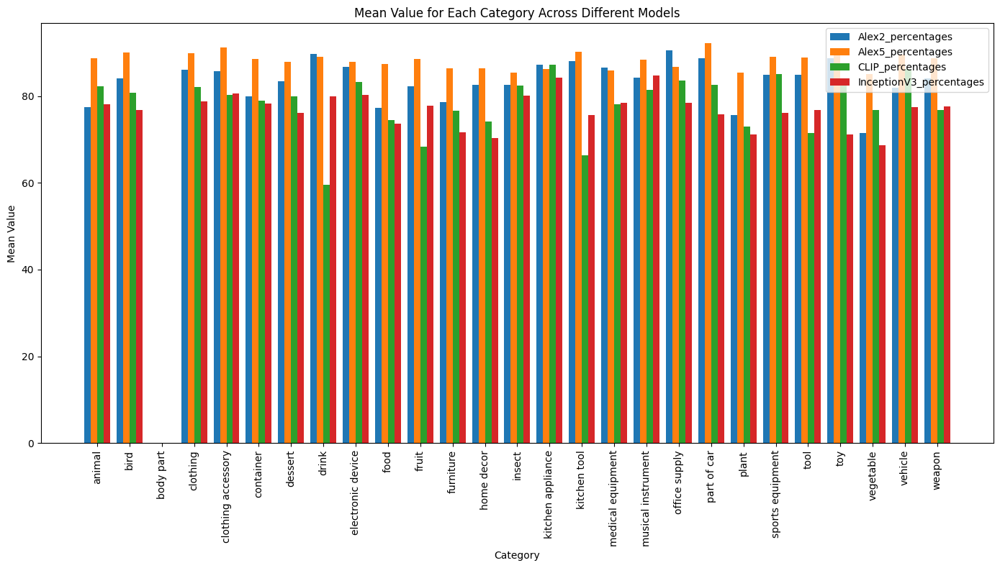

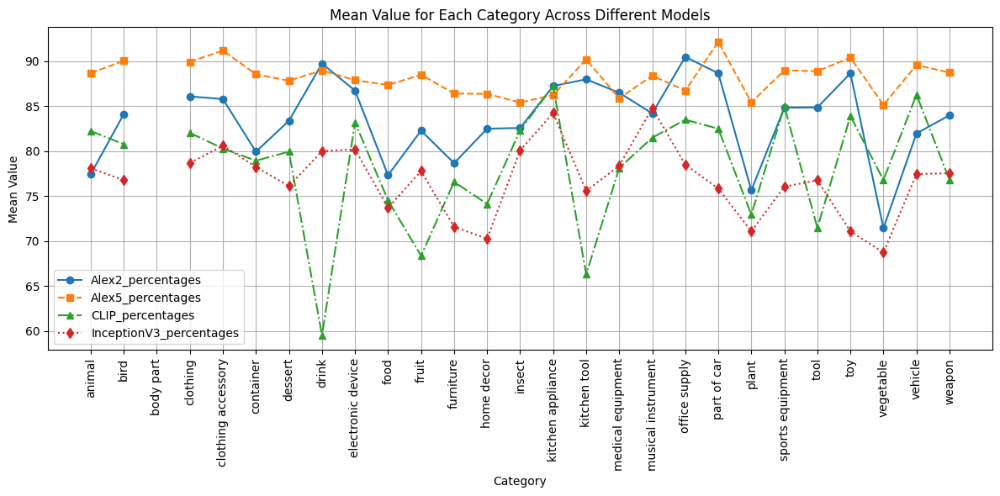

In [21]:
# Function to calculate mean values for each category
def calculate_mean_values(values, index_dict):
    mean_values = {}
    for category, indices in index_dict.items():
        if indices:
            mean_values[category] = values[indices].mean()
        else:
            mean_values[category] = np.nan  # Handle categories with no indices
    return mean_values

Alex2_percentages
Alex5_percentages
CLIP_percentages
InceptionV3_percentages

x = np.arange(1, 201)  # 横坐标从1到200
df = pd.read_csv('../../../THINGS-EEG/test_categories.tsv', sep='\t')

index_dict = {}

# Iterate through each column
for column in df.columns:
    # Find the indices where the value is 1
    indices = df.index[df[column] == 1].tolist()
    # Store the indices in the dictionary
    index_dict[column] = indices

for category, indices in index_dict.items():
    print(f"{category}: {[category_list[i] for i in indices]}")
# Calculate mean values for each array
mean_Alex2 = calculate_mean_values(Alex2_percentages, index_dict)
mean_Alex5 = calculate_mean_values(Alex5_percentages, index_dict)
mean_CLIP = calculate_mean_values(CLIP_percentages, index_dict)
mean_InceptionV3 = calculate_mean_values(InceptionV3_percentages, index_dict)

# Convert the dictionaries to DataFrames for plotting
mean_df_Alex2 = pd.DataFrame(list(mean_Alex2.items()), columns=['Category', 'Mean_Alex2'])
mean_df_Alex5 = pd.DataFrame(list(mean_Alex5.items()), columns=['Category', 'Mean_Alex5'])
mean_df_CLIP = pd.DataFrame(list(mean_CLIP.items()), columns=['Category', 'Mean_CLIP'])
mean_df_InceptionV3 = pd.DataFrame(list(mean_InceptionV3.items()), columns=['Category', 'Mean_InceptionV3'])

# Merge DataFrames on 'Category'
mean_df = mean_df_Alex2.merge(mean_df_Alex5, on='Category').merge(mean_df_CLIP, on='Category').merge(mean_df_InceptionV3, on='Category')

# Plot the bar chart
plt.figure(figsize=(14, 8))
bar_width = 0.2
categories = mean_df['Category']
x = np.arange(len(categories))

plt.bar(x - bar_width*1.5, mean_df['Mean_Alex2'], width=bar_width, label='Alex2_percentages')
plt.bar(x - bar_width/2, mean_df['Mean_Alex5'], width=bar_width, label='Alex5_percentages')
plt.bar(x + bar_width/2, mean_df['Mean_CLIP'], width=bar_width, label='CLIP_percentages')
plt.bar(x + bar_width*1.5, mean_df['Mean_InceptionV3'], width=bar_width, label='InceptionV3_percentages')

plt.xticks(x, categories, rotation=90)
plt.xlabel('Category')
plt.ylabel('Mean Value')
plt.title('Mean Value for Each Category Across Different Models')
plt.legend()
plt.tight_layout()
plt.show()

# Plot the line graph
plt.figure(figsize=(12, 6))
plt.plot(mean_df['Category'], mean_df['Mean_Alex2'], marker='o', label='Alex2_percentages', linestyle='-')
plt.plot(mean_df['Category'], mean_df['Mean_Alex5'], marker='s', label='Alex5_percentages', linestyle='--')
plt.plot(mean_df['Category'], mean_df['Mean_CLIP'], marker='^', label='CLIP_percentages', linestyle='-.')
plt.plot(mean_df['Category'], mean_df['Mean_InceptionV3'], marker='d', label='InceptionV3_percentages', linestyle=':')

plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylabel('Mean Value')
plt.title('Mean Value for Each Category Across Different Models')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# plt.figure(figsize=(20, 10))  

# plt.plot(x, Alex2_percentages, label='Alex2_percentages', color='b', marker='o')
# plt.plot(x, Alex5_percentages, label='Alex5_percentages', color='g', marker='s')
# plt.plot(x, CLIP_percentages, label='CLIP_percentages', color='r', marker='^')
# plt.plot(x, InceptionV3_percentages, label='InceptionV3_percentages', color='c', marker='d')

# plt.title('Percentages Comparison')
# plt.xlabel('Index')
# plt.ylabel('Percentages (%)')
# plt.ylim(0, 100)  # 设置纵坐标范围
# plt.legend()  
# plt.grid(True)
# plt.tight_layout()  
# plt.show()


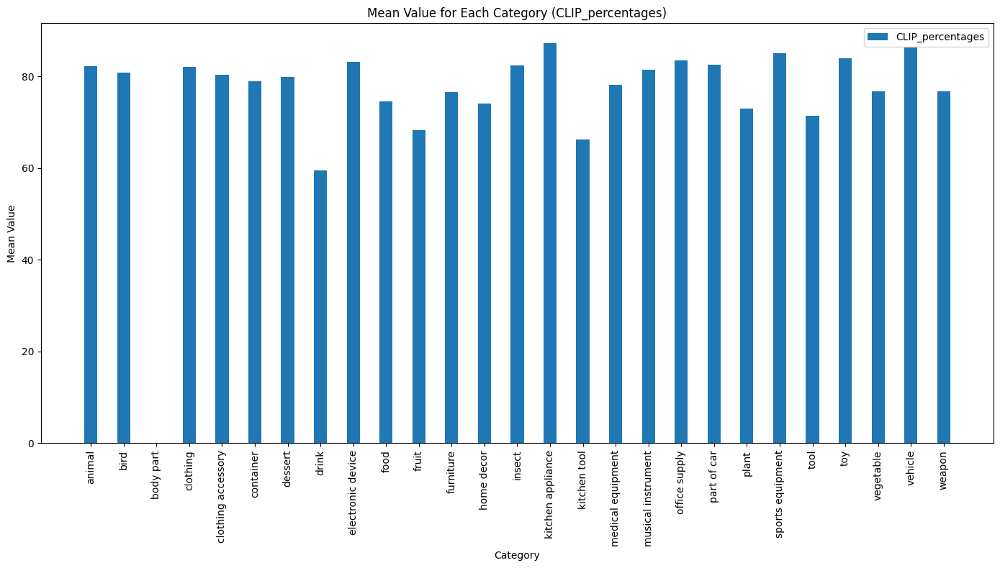

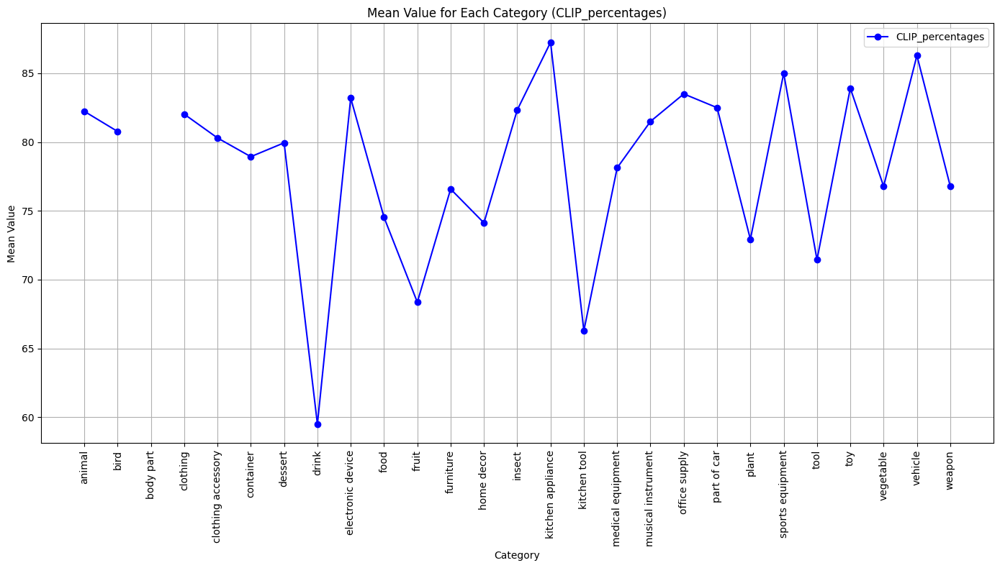

In [22]:


# Assuming your data is in a DataFrame called df
# Reindex the DataFrame
df = pd.read_csv('../../../THINGS-EEG/test_categories.tsv', sep='\t')

# Initialize a dictionary to store the results
index_dict = {}

# Iterate through each column
for column in df.columns:
    # Find the indices where the value is 1
    indices = df.index[df[column] == 1].tolist()
    # Store the indices in the dictionary
    index_dict[column] = indices


# Function to calculate mean values for each category
def calculate_mean_values(values, index_dict):
    mean_values = {}
    for category, indices in index_dict.items():
        if indices:
            mean_values[category] = values[indices].mean()
        else:
            mean_values[category] = np.nan  # Handle categories with no indices
    return mean_values

# Calculate mean values for CLIP_percentages
mean_CLIP = calculate_mean_values(CLIP_percentages, index_dict)

# Convert the dictionary to a DataFrame for plotting
mean_df_CLIP = pd.DataFrame(list(mean_CLIP.items()), columns=['Category', 'Mean_CLIP'])

# Plot the bar chart
plt.figure(figsize=(14, 8))
categories = mean_df_CLIP['Category']
x = np.arange(len(categories))

plt.bar(x, mean_df_CLIP['Mean_CLIP'], width=0.4, label='CLIP_percentages')

plt.xticks(x, categories, rotation=90)
plt.xlabel('Category')
plt.ylabel('Mean Value')
plt.title('Mean Value for Each Category (CLIP_percentages)')
plt.legend()
plt.tight_layout()
plt.show()

# Plot the line graph
plt.figure(figsize=(14, 8))
plt.plot(categories, mean_df_CLIP['Mean_CLIP'], marker='o', linestyle='-', color='blue', label='CLIP_percentages')
plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylabel('Mean Value')
plt.title('Mean Value for Each Category (CLIP_percentages)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Indices of specified elements: [9, 26, 50, 58, 63, 79, 81, 83, 86, 95, 96, 107, 120, 123, 132, 148, 154, 156, 163, 171, 186, 194, 195, 212, 213, 216, 220, 227, 239, 254, 278, 281, 284, 286, 290, 298, 306, 312, 315, 320, 328, 339, 353, 354, 369, 371, 375, 378, 382, 400, 408, 425, 428, 439, 440, 441, 442, 446, 450, 451, 461, 469, 471, 481, 514, 517, 522, 529, 537, 545, 546, 554, 560, 570, 580, 608, 625, 634, 640, 642, 645, 658, 680, 689, 691, 693, 694, 695, 706, 713, 740, 741, 745, 768, 777, 792, 811, 818, 819, 843, 844, 857, 868, 878, 887, 889, 893, 902, 920, 929, 964, 974, 990, 996, 1003, 1011, 1020, 1034, 1041, 1042, 1059, 1074, 1076, 1077, 1078, 1081, 1084, 1099, 1106, 1117, 1133, 1150, 1160, 1166, 1168, 1171, 1173, 1205, 1207, 1223, 1225, 1228, 1239, 1249, 1255, 1259, 1274, 1284, 1297, 1306, 1318, 1330, 1340, 1347, 1352, 1356, 1365, 1372, 1373, 1382, 1395, 1400, 1401, 1449, 1460, 1462, 1464, 1467, 1485, 1508, 1519, 1542, 1550, 1570, 1577, 1580, 1606, 1608, 1617, 1624, 1641, 1655, 16

Text(0, 0.5, 'Count of Ones')

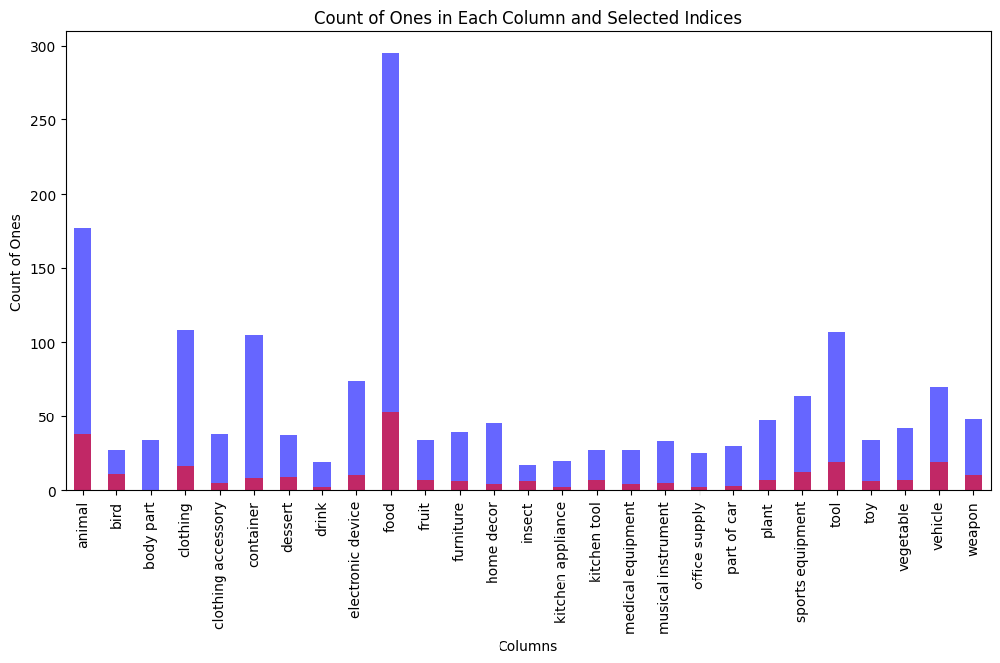

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv(r'/home/caoxuhao1/EEG_Image_decode-main/THINGS-EEG/27 higher-level categories/category_mat_manual.tsv', sep='\t')
test_names = ['aircraft_carrier', 'antelope', 'backscratcher', 'balance_beam', 'banana', 'baseball_bat', 'basil', 'basketball', 'bassoon', 'baton4', 'batter', 'beaver', 'bench', 'bike', 'birthday_cake', 'blowtorch', 'boat', 'bok_choy', 'bonnet', 'bottle_opener', 'brace', 'bread', 'breadbox', 'bug', 'buggy', 'bullet', 'bun', 'bush', 'calamari', 'candlestick', 'cart', 'cashew', 'cat', 'caterpillar', 'cd_player', 'chain', 'chaps', 'cheese', 'cheetah', 'chest2', 'chime', 'chopsticks', 'cleat', 'cleaver', 'coat', 'cobra', 'coconut', 'coffee_bean', 'coffeemaker', 'cookie', 'cordon_bleu', 'coverall', 'crab', 'creme_brulee', 'crepe', 'crib', 'croissant', 'crow', 'cruise_ship', 'crumb', 'cupcake', 'dagger', 'dalmatian', 'dessert', 'dragonfly', 'dreidel', 'drum', 'duffel_bag', 'eagle', 'eel', 'egg', 'elephant', 'espresso', 'face_mask', 'ferry', 'flamingo', 'folder', 'fork', 'freezer', 'french_horn', 'fruit', 'garlic', 'glove', 'golf_cart', 'gondola', 'goose', 'gopher', 'gorilla', 'grasshopper', 'grenade', 'hamburger', 'hammer', 'handbrake', 'headscarf', 'highchair', 'hoodie', 'hummingbird', 'ice_cube', 'ice_pack', 'jeep', 'jelly_bean', 'jukebox', 'kettle', 'kneepad', 'ladle', 'lamb', 'lampshade', 'laundry_basket', 'lettuce', 'lightning_bug', 'manatee', 'marijuana', 'meatloaf', 'metal_detector', 'minivan', 'modem', 'mosquito', 'muff', 'music_box', 'mussel', 'nightstand', 'okra', 'omelet', 'onion', 'orange', 'orchid', 'ostrich', 'pajamas', 'panther', 'paperweight', 'pear', 'pepper1', 'pheasant', 'pickax', 'pie', 'pigeon', 'piglet', 'pocket', 'pocketknife', 'popcorn', 'popsicle', 'possum', 'pretzel', 'pug', 'punch2', 'purse', 'radish', 'raspberry', 'recorder', 'rhinoceros', 'robot', 'rooster', 'rug', 'sailboat', 'sandal', 'sandpaper', 'sausage', 'scallion', 'scallop', 'scooter', 'seagull', 'seaweed', 'seed', 'skateboard', 'sled', 'sleeping_bag', 'slide', 'slingshot', 'snowshoe', 'spatula', 'spoon', 'station_wagon', 'stethoscope', 'strawberry', 'submarine', 'suit', 't-shirt', 'table', 'taillight', 'tape_recorder', 'television', 'tiara', 'tick', 'tomato_sauce', 'tongs', 'tool', 'top_hat', 'treadmill', 'tube_top', 'turkey', 'unicycle', 'vise', 'volleyball', 'wallpaper', 'walnut', 'wheat', 'wheelchair', 'windshield', 'wine', 'wok']

# Read the unique_id.csv file
df_names = pd.read_csv('../../../THINGS-EEG/unique_id.csv', header=None)

# Extract the first column
first_column = df_names[0]

# Find indices of specified elements
indices = [first_column[first_column == element].index[0] for element in test_names]

print("Indices of specified elements:", indices)

# Count the number of ones in each column
count_ones = df.apply(lambda x: (x == 1).sum())

# Convert the result to a dictionary
count_ones_dict = count_ones.to_dict()


# Plot the count of ones for the selected indices
selected_indices = df.iloc[indices]
selected_indices.to_csv('../../../THINGS-EEG/test_categories.tsv', sep='\t', index=False)
selected_indices_count = df.iloc[indices].apply(lambda x: (x == 1).sum())
# print(selected_indices_count)


plt.figure(figsize=(12, 6))
count_ones.plot(kind='bar', color='blue', alpha=0.6, label='All Columns')
selected_indices_count.plot(kind='bar', color='red', alpha=0.6, label='Selected Indices')
plt.title('Count of Ones in Each Column and Selected Indices')
plt.xlabel('Columns')
plt.ylabel('Count of Ones')


Indices of specified elements: [9, 26, 50, 58, 63, 79, 81, 83, 86, 95, 96, 107, 120, 123, 132, 148, 154, 156, 163, 171, 186, 194, 195, 212, 213, 216, 220, 227, 239, 254, 278, 281, 284, 286, 290, 298, 306, 312, 315, 320, 328, 339, 353, 354, 369, 371, 375, 378, 382, 400, 408, 425, 428, 439, 440, 441, 442, 446, 450, 451, 461, 469, 471, 481, 514, 517, 522, 529, 537, 545, 546, 554, 560, 570, 580, 608, 625, 634, 640, 642, 645, 658, 680, 689, 691, 693, 694, 695, 706, 713, 740, 741, 745, 768, 777, 792, 811, 818, 819, 843, 844, 857, 868, 878, 887, 889, 893, 902, 920, 929, 964, 974, 990, 996, 1003, 1011, 1020, 1034, 1041, 1042, 1059, 1074, 1076, 1077, 1078, 1081, 1084, 1099, 1106, 1117, 1133, 1150, 1160, 1166, 1168, 1171, 1173, 1205, 1207, 1223, 1225, 1228, 1239, 1249, 1255, 1259, 1274, 1284, 1297, 1306, 1318, 1330, 1340, 1347, 1352, 1356, 1365, 1372, 1373, 1382, 1395, 1400, 1401, 1449, 1460, 1462, 1464, 1467, 1485, 1508, 1519, 1542, 1550, 1570, 1577, 1580, 1606, 1608, 1617, 1624, 1641, 1655, 16

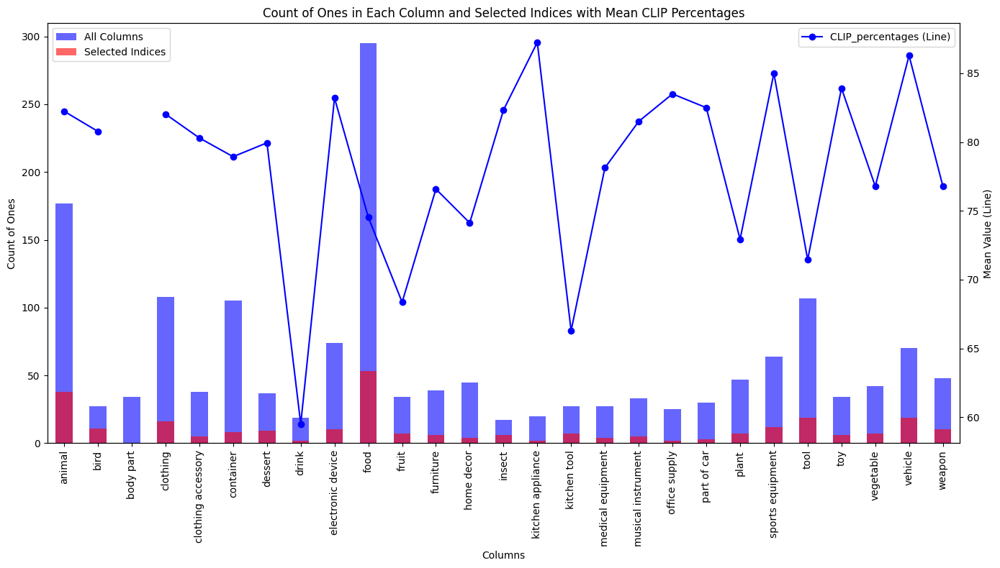

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv(r'/home/caoxuhao1/EEG_Image_decode-main/THINGS-EEG/27 higher-level categories/category_mat_manual.tsv', sep='\t')
test_names = ['aircraft_carrier', 'antelope', 'backscratcher', 'balance_beam', 'banana', 'baseball_bat', 'basil', 'basketball', 'bassoon', 'baton4', 'batter', 'beaver', 'bench', 'bike', 'birthday_cake', 'blowtorch', 'boat', 'bok_choy', 'bonnet', 'bottle_opener', 'brace', 'bread', 'breadbox', 'bug', 'buggy', 'bullet', 'bun', 'bush', 'calamari', 'candlestick', 'cart', 'cashew', 'cat', 'caterpillar', 'cd_player', 'chain', 'chaps', 'cheese', 'cheetah', 'chest2', 'chime', 'chopsticks', 'cleat', 'cleaver', 'coat', 'cobra', 'coconut', 'coffee_bean', 'coffeemaker', 'cookie', 'cordon_bleu', 'coverall', 'crab', 'creme_brulee', 'crepe', 'crib', 'croissant', 'crow', 'cruise_ship', 'crumb', 'cupcake', 'dagger', 'dalmatian', 'dessert', 'dragonfly', 'dreidel', 'drum', 'duffel_bag', 'eagle', 'eel', 'egg', 'elephant', 'espresso', 'face_mask', 'ferry', 'flamingo', 'folder', 'fork', 'freezer', 'french_horn', 'fruit', 'garlic', 'glove', 'golf_cart', 'gondola', 'goose', 'gopher', 'gorilla', 'grasshopper', 'grenade', 'hamburger', 'hammer', 'handbrake', 'headscarf', 'highchair', 'hoodie', 'hummingbird', 'ice_cube', 'ice_pack', 'jeep', 'jelly_bean', 'jukebox', 'kettle', 'kneepad', 'ladle', 'lamb', 'lampshade', 'laundry_basket', 'lettuce', 'lightning_bug', 'manatee', 'marijuana', 'meatloaf', 'metal_detector', 'minivan', 'modem', 'mosquito', 'muff', 'music_box', 'mussel', 'nightstand', 'okra', 'omelet', 'onion', 'orange', 'orchid', 'ostrich', 'pajamas', 'panther', 'paperweight', 'pear', 'pepper1', 'pheasant', 'pickax', 'pie', 'pigeon', 'piglet', 'pocket', 'pocketknife', 'popcorn', 'popsicle', 'possum', 'pretzel', 'pug', 'punch2', 'purse', 'radish', 'raspberry', 'recorder', 'rhinoceros', 'robot', 'rooster', 'rug', 'sailboat', 'sandal', 'sandpaper', 'sausage', 'scallion', 'scallop', 'scooter', 'seagull', 'seaweed', 'seed', 'skateboard', 'sled', 'sleeping_bag', 'slide', 'slingshot', 'snowshoe', 'spatula', 'spoon', 'station_wagon', 'stethoscope', 'strawberry', 'submarine', 'suit', 't-shirt', 'table', 'taillight', 'tape_recorder', 'television', 'tiara', 'tick', 'tomato_sauce', 'tongs', 'tool', 'top_hat', 'treadmill', 'tube_top', 'turkey', 'unicycle', 'vise', 'volleyball', 'wallpaper', 'walnut', 'wheat', 'wheelchair', 'windshield', 'wine', 'wok']

# Read the unique_id.csv file
df_names = pd.read_csv('../../../THINGS-EEG/unique_id.csv', header=None)

# Extract the first column
first_column = df_names[0]

# Find indices of specified elements
indices = [first_column[first_column == element].index[0] for element in test_names]

print("Indices of specified elements:", indices)

# Count the number of ones in each column
count_ones = df.apply(lambda x: (x == 1).sum())

# Convert the result to a dictionary
count_ones_dict = count_ones.to_dict()

print(count_ones_dict)


# Assuming you have mean_df_CLIP DataFrame from previous steps
# Plot the combined bar and line chart
fig, ax1 = plt.subplots(figsize=(14, 8))

# Bar chart for count of ones
count_ones.plot(kind='bar', color='blue', alpha=0.6, label='All Columns', ax=ax1)
selected_indices_count.plot(kind='bar', color='red', alpha=0.6, label='Selected Indices', ax=ax1)
ax1.set_xlabel('Columns')
ax1.set_ylabel('Count of Ones')
ax1.legend(loc='upper left')

# Create a second y-axis for the line plot
ax2 = ax1.twinx()
ax2.plot(mean_df_CLIP['Category'], mean_df_CLIP['Mean_CLIP'], marker='o', linestyle='-', color='blue', label='CLIP_percentages (Line)')
ax2.set_ylabel('Mean Value (Line)')
ax2.legend(loc='upper right')

plt.title('Count of Ones in Each Column and Selected Indices with Mean CLIP Percentages')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [25]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import torch
# from torchvision import transforms
# from torchvision.utils import make_grid

# # 假设你的数据已经加载到 all_images 和 all_brain_recons 中
# imsize = 256
# all_images = transforms.Resize((imsize, imsize))(all_images)
# all_brain_recons = transforms.Resize((imsize, imsize))(all_brain_recons)

# # 读取类别信息
# df = pd.read_csv('../../../THINGS-EEG/test_categories.tsv', sep='\t')

# # 创建一个字典来存储每个类别的图片
# category_images = {category: [] for category in df.columns}

# # 根据类别索引将图片添加到相应的类别列表中
# for idx, row in df.iterrows():
#     for category in df.columns:
#         if row[category] == 1:
#             category_images[category].append((all_images[idx], all_brain_recons[idx], idx))

# # 定义显示图片的函数
# def show(imgs, figsize):
#     if not isinstance(imgs, list):
#         imgs = [imgs]
#     fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=figsize)
#     for i, img in enumerate(imgs):
#         img = img.detach()
#         img = transforms.ToPILImage()(img / 255.0)
#         axs[0, i].imshow(np.asarray(img))
#         axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
#     plt.show()

# # 分别绘制每个类别的图片并打印 CLIP 值
# for category, images in category_images.items():
#     if images:  # 确保类别中有图片
#         interleaved_images = []
#         clip_values = []
#         for idx, (img, recon, img_idx) in enumerate(images):
#             interleaved_images.append(img)
#             interleaved_images.append(recon)
#             clip_values.append(f"{idx+1}: {CLIP_percentages[img_idx]:.2f}")

#         all_interleaved = torch.stack(interleaved_images)
#         grid = make_grid(all_interleaved, nrow=10, padding=2)
#         print(f"Category: {category}")
        
#         # 打印 CLIP 值，每 5 个换行
#         for i in range(0, len(clip_values), 5):
#             print(", ".join(clip_values[i:i+5]))
        
#         show(grid, figsize=(64, 64))
